In [ ]:
!pip install langchain
!pip install google-generativeai
!pip install -q neo4j-driver
!pip install -q gradio
!pip install openai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.3/45.3 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.2/133.2 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 267.9/267.9 kB 11.2 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.9/192.9 kB 3.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.4/15.4 MB 29.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.9/92.9 kB 10.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.7/302.7 kB 23.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.0/75.0 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 28.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.7/138.7 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 395.8/395.8 kB 34.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

# IMPORTS

Here we are using the GraphCypherQAChain from the langchain module that can retirive data from the Neo4j Graph we are using for the worldbank data

In [ ]:
import os

from langchain.chat_models import ChatOpenAI
from langchain.chains import GraphCypherQAChain
from langchain.graphs import Neo4jGraph
import json
import gradio as gr
from neo4j import GraphDatabase

The LLM we are using is the google palm 2 model based on google bard.ai
The palm api is free to use without any limit

## Example prompt

In [ ]:
from langchain.embeddings import GooglePalmEmbeddings
from langchain.llms import GooglePalm
import google.generativeai
import os

google_api_key='YOUR API KEY'

llm = GooglePalm(google_api_key=google_api_key)
llm.temperature = 0.1

prompts = ['give information on knowledge graphs in 50 words']
llm_result = llm._generate(prompts)

print(llm_result.generations[0][0].text)

A knowledge graph is a structured representation of information that can be used to represent entities, their attributes, and the relationships between them.


neo4j_query_graph_2023-11-12.png

### SCHEMA OF OUR DATA

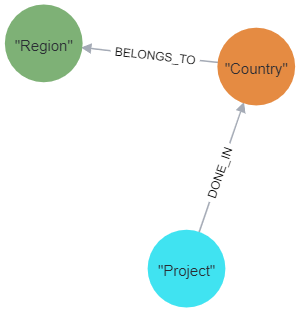

PROMPT TEMPLATE

In [ ]:
from langchain.prompts.prompt import PromptTemplate


CYPHER_GENERATION_TEMPLATE = """
Task:Generate Cypher statement to query a graph database.
Instructions:
Use only the provided relationship types and properties in the schema.
Do not use any other relationship types or properties that are not provided.
Schema:

  {schema}

  You have a Graph data on the various projects done by the world bank .as there is only one database you dont need to select the database explicitly .it has list of countries in which the project is run and also about the deatils of the project . The Graph has following Node Labels - Country, Project  and  Region, Country Node label has the following property 'name' , Region node has the property 'name',Project node has the following properties given as a key value format  with key being the property name and value being the meaning of the property // id : every world bank project has has a unique 7 character id starting with P
// URL : a string value having the url of each project
// agency : showing the agency which implements the project
// cname : country in which the project is being done
// current_cost : float value that is current cost the project has caused
// grant : the amount the particular project has recieved in the form of grant in float value
// l : lending instrument used by the worldbank ,it is a string value
// name : name of the project
// objective : the objective the company or the bank wishes to achieve by implementing  the project

// status : current status of the project , it may have values Pipeline,Dropped,Completed etc
// total_expense : total expens or expenditure the project will cause

// total_commitment : float value which says the amount in total required fro the project completion
 and the Graph has the following Relationship types BELONGS_TO  between Country node and region node.The BELONGS_TO relation is from Country to Region and not other way around .There is another relation from Project node to country node DONE_IN , DONE_IN relation has the following  properties  // lendinginstrument:  type of investment //total_expenditure: float value showing the possible total cost of the project .//

     relationships  BELONGS_TO start from Project  to Country  and not the other way around.
Cypher examples:
 Example 1 -Find all countries in the region named 'Africa'
    ``` MATCH (c:Country)-[:BELONGS_TO]->(r:Region { name: 'Africa'})
        RETURN c;

    ```

    Example 2 -List the projects implemented in the country 'Republic of India'
    ```
    MATCH (p:Project)-[:DONE_IN]->(c:Country {name: 'Republic of India'})
    RETURN p;

    ```

    Example 3 -Show the lending instruments used in projects with a current cost greater than 1 million:
    ```
    MATCH (p:Project)
    WHERE p.current_cost > 1000000
    RETURN DISTINCT p.l AS lendingInstrument;

    ```
    Example 4 - Project with highest expense:
  ```
    MATCH (p:Project)
    RETURN p.name
    ORDER BY p.total_expense DESC
    LIMIT 1;


Note: Do not include any explanations or apologies in your responses.
Do not respond to any questions that might ask anything else than for you to construct a Cypher statement.
Do not include any text except the generated Cypher statement.

The question is:
{question}"""
CYPHER_GENERATION_PROMPT = PromptTemplate(
    input_variables=["schema", "question"], template=CYPHER_GENERATION_TEMPLATE
)

Driver Connector For Neo4j

we are connecting to an instance of Neo4jGraph which is hosted on Neo4j's AuraDB cloud platform which provides free graph database hosting  

In [ ]:



graph = Neo4jGraph(
    url="neo4j+s://5506c23a.databases.neo4j.io",
    username="neo4j",
    password="xpQ-l5L15YaCDrGHXICsrljWfiQY4NL9PdOh6kLrpRg")


chain = GraphCypherQAChain.from_llm(
    llm, graph=graph, verbose=True,
)

In [ ]:
chain_language_example = GraphCypherQAChain.from_llm(
    llm, graph=graph, verbose=True,
    cypher_prompt=CYPHER_GENERATION_PROMPT
)


TEST Query

The below question is being answered comfortably by the model

In [ ]:
chain.run("""
total number of projects?
""")



> Entering new GraphCypherQAChain chain...
Generated Cypher:
MATCH (p:Project) RETURN count(p)
Full Context:
[{'count(p)': 22137}]

> Finished chain.


'There are 22137 projects.'

In [ ]:
chain.run("""
 top 3 projects with highest expense ?
""")



> Entering new GraphCypherQAChain chain...
Generated Cypher:
MATCH (p:Project)-[:DONE_IN]->(c:Country) WITH p, c ORDER BY p.total_expense DESC LIMIT 3 RETURN p.name, p.total_expense
Full Context:
[{'p.name': 'Indonesia - Supporting Primary Health Care Reform', 'p.total_expense': 93157000000.0}, {'p.name': 'Nigeria Human Capital for Opportunities and Empowerment (HOPE)', 'p.total_expense': 57530000000.0}, {'p.name': 'Argentina Infrastructure Guarantee Facility for Private Financial Market Funding', 'p.total_expense': 47000880000.0}]

> Finished chain.


'The top 3 projects with highest expense are: Indonesia - Supporting Primary Health Care Reform, Nigeria Human Capital for Opportunities and Empowerment (HOPE), and Argentina Infrastructure Guarantee Facility for Private Financial Market Funding.'

Chat Bot interface using Gradio

Run the below cell to start a QA interface which is made by using the gradio library

In [ ]:
def chatbot(input, history=[]):
    output = str(chain.run(str(input)))
    history.append((input, output))
    return history, history

In [ ]:
gr.Interface(fn = chatbot,
             inputs = ["text",'state'],
             outputs = ["chatbot",'state']).launch(debug = True)

Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://1053689d4d262eaf06.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)




> Entering new GraphCypherQAChain chain...
Generated Cypher:
SELECT p.name, p.total_expense FROM Project AS p ORDER BY p.total_expense DESC LIMIT 3


Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/langchain/graphs/neo4j_graph.py", line 112, in query
    data = session.run(query, params)
  File "/usr/local/lib/python3.10/dist-packages/neo4j/_sync/work/session.py", line 312, in run
    self._auto_result._run(
  File "/usr/local/lib/python3.10/dist-packages/neo4j/_sync/work/result.py", line 181, in _run
    self._attach()
  File "/usr/local/lib/python3.10/dist-packages/neo4j/_sync/work/result.py", line 292, in _attach
    self._connection.fetch_message()
  File "/usr/local/lib/python3.10/dist-packages/neo4j/_sync/io/_common.py", line 180, in inner
    func(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/neo4j/_sync/io/_bolt.py", line 851, in fetch_message
    res = self._process_message(tag, fields)
  File "/usr/local/lib/python3.10/dist-packages/neo4j/_sync/io/_bolt5.py", line 376, in _process_message
    response.on_failure(summary_metadata or {})
  File "/usr/local/lib/python3.10/

Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://1053689d4d262eaf06.gradio.live
